In [1]:
!pip install pandas
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error as mse
from numpy import sqrt

Defaulting to user installation because normal site-packages is not writeable


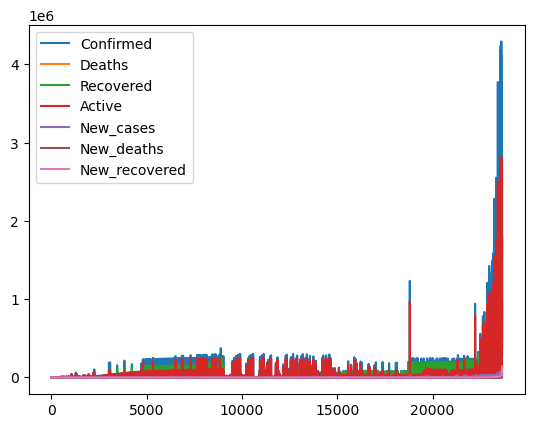

In [3]:
#%%
path="D:\FGC2.csv"
FGC2=pd.read_csv(path)
FGC2.plot()
plt.show()
series = FGC2['Deaths']

FGC2.head(20)

y = FGC2['Deaths']
y_train =FGC2['Deaths'][:-5000]
y_test = FGC2['Deaths'][-5000:]

In [4]:

#%%
##############AutoRegressive Models SARIMA ########################
!pip install pmdarima
from pmdarima.arima import auto_arima
#train MA
model = auto_arima(y_train, trace = True,
                   error_action = 'ignore',
                   suppress_warnings = True,
                   seasonal = True, m = 12) #m = Period interval

Defaulting to user installation because normal site-packages is not writeable
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=34.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=370809.870, Time=0.57 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=365126.029, Time=3.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=39.61 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=370807.870, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=365128.384, Time=0.57 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=365126.452, Time=10.71 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=365127.979, Time=4.92 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=365125.949, Time=3.74 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=365126.522, Time=11.24 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=365128.509, Time=16.00 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=370807.746, Time=2.85 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=363053.804, Time=

In [5]:

#%%
#Make predictions
forecast = model.predict(n_periods = len(y_test))
forecast = pd.DataFrame(forecast, index = y_test.index,
                        columns = ['Prediction'])


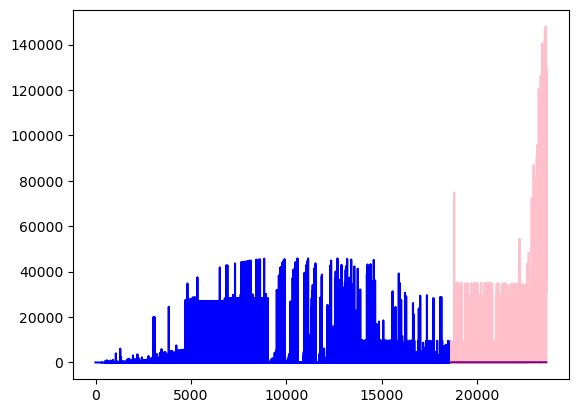

In [6]:

#%%

plt.plot(y_train, color = 'blue', label = 'Train')
plt.plot(y_test, color = 'pink', label = 'Test')
plt.plot(forecast, color = 'purple', label = 'Forecast')


In [12]:


#%%
error = round(sqrt(mse(y_test, forecast)),2)

#plt.text(0.5, 0.5, 'Axis', transform = y_test.transAxes)

plt.text(100,150, 'RMSE = ' + str(error))
plt.legend(loc = 'best')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
